# Project: Chronic Kidney Disease: Clustering & Prediction

## This project is made of three parts:
### - Pre-processing
### - Exploratory Data Analysis
### - Clustering & Prediction

## A brief description:
### Data:

It contains measures of 24 features for 400 people. Quite a lot of features for just 400 samples.  
14 features are numerical, while 10 are categorical.
### Pre-processing:
   We Started with data cleaning because of typos and mistyped features.   
Missing values were imputed with KNN.  
We had to try many transformers before imputing.
### Exploratory Data Analysis:
We plotted graphs showing distributions of features and relationships between them.  
Didn't see much correlation, but one can further do hypothesis testing to be more certain.  
This was also indicated by the fact that PCA didn't make any significant difference, and that Naive Bayes performed impressively.   

### Prediction:
  
We compared different supervised models, combining them with Principal Component Analysis.  
We also trained two neural nets of different sizes.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import warnings
warnings.filterwarnings("ignore")

# Pre-processing

### A bit of exploration

In [ ]:
feature_names=['Age (yrs)','Blood Pressure (mm/Hg)','Specific Gravity','Albumin','Sugar','Red Blood Cells',
               'Pus Cells','Pus Cell Clumps','Bacteria','Blood Glucose Random (mgs/dL)','Blood Urea (mgs/dL)',
               'Serum Creatinine (mgs/dL)','Sodium (mEq/L)','Potassium (mEq/L)','Hemoglobin (gms)','Packed Cell Volume',
               'White Blood Cells (cells/cmm)','Red Blood Cells (millions/cmm)','Hypertension','Diabetes Mellitus',
               'Coronary Artery Disease','Appetite','Pedal Edema','Anemia','Chronic Kidney Disease']
               
data=pd.read_csv("chronic_kidney_disease.csv", names = feature_names)

In [ ]:
data.head()

,Age (yrs),Blood Pressure (mm/Hg),Specific Gravity,Albumin,Sugar,Red Blood Cells,Pus Cells,Pus Cell Clumps,Bacteria,Blood Glucose Random (mgs/dL),...,Packed Cell Volume,White Blood Cells (cells/cmm),Red Blood Cells (millions/cmm),Hypertension,Diabetes Mellitus,Coronary Artery Disease,Appetite,Pedal Edema,Anemia,Chronic Kidney Disease
0,48,80,1.02,1,0,?,normal,notpresent,notpresent,121,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,7,50,1.02,4,0,?,normal,notpresent,notpresent,?,...,38,6000,?,no,no,no,good,no,no,ckd
2,62,80,1.01,2,3,normal,normal,notpresent,notpresent,423,...,31,7500,?,no,yes,no,poor,no,yes,ckd
3,48,70,1.005,4,0,normal,abnormal,present,notpresent,117,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,51,80,1.01,2,0,normal,normal,notpresent,notpresent,106,...,35,7300,4.6,no,no,no,good,no,no,ckd


We can see there are missing values.  
If their number is considerable, then we would have to be careful about which imputation technique to use.  

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Age (yrs)                       400 non-null    object
 1   Blood Pressure (mm/Hg)          400 non-null    object
 2   Specific Gravity                400 non-null    object
 3   Albumin                         400 non-null    object
 4   Sugar                           400 non-null    object
 5   Red Blood Cells                 400 non-null    object
 6   Pus Cells                       400 non-null    object
 7   Pus Cell Clumps                 400 non-null    object
 8   Bacteria                        400 non-null    object
 9   Blood Glucose Random (mgs/dL)   400 non-null    object
 10  Blood Urea (mgs/dL)             400 non-null    object
 11  Serum Creatinine (mgs/dL)       400 non-null    object
 12  Sodium (mEq/L)                  400 non-null    ob

Many features are mistyped.  
Some features have quite a lot of missing values.  
One option is to drop them, but it's best to impute them with a decent imputation technique that preserves distributions, since we do not have many datapoints.
There are many techniques to choose.  
we will be using the KNNImputer from sklearn.

In [ ]:
data.describe()

,Age (yrs),Blood Pressure (mm/Hg),Specific Gravity,Albumin,Sugar,Red Blood Cells,Pus Cells,Pus Cell Clumps,Bacteria,Blood Glucose Random (mgs/dL),...,Packed Cell Volume,White Blood Cells (cells/cmm),Red Blood Cells (millions/cmm),Hypertension,Diabetes Mellitus,Coronary Artery Disease,Appetite,Pedal Edema,Anemia,Chronic Kidney Disease
count,400,400,400,400,400,400,400,400,400,400,...,400,400,400,400,400,400,400,400,400,400
unique,77,11,6,7,7,3,3,3,3,147,...,45,93,47,3,6,4,3,3,3,3
top,60,80,1.02,0,0,normal,normal,notpresent,notpresent,?,...,?,?,?,no,no,no,good,no,no,ckd
freq,19,116,106,199,290,201,259,354,374,44,...,70,105,130,251,258,362,317,323,339,248


You can see that some features have some serious outliers.  

---



### Data Cleaning

Let's deal with typos first. 

In [ ]:
#Correcting some typos in the dataset
for i in range(data.shape[0]):
    if data.iloc[i,24]=='ckd\t':
        data.iloc[i,24]='ckd'
    if data.iloc[i,19] in [' yes','\tyes']:
        data.iloc[i,19]='yes'
    if data.iloc[i,19]=='\tno':
        data.iloc[i,19]='no'
    if data.iloc[i,20]=='\tno':
        data.iloc[i,20]='no'
    if data.iloc[i,15]=='\t?':
        data.iloc[i,15]=np.nan
    if data.iloc[i,15]=='\t43':
        data.iloc[i,15]='43'
    if data.iloc[i,16]=='\t?':
        data.iloc[i,16]=np.nan
    if data.iloc[i,16]=='\t6200':
        data.iloc[i,16]= '6200'
    if data.iloc[i,16]=='\t8400':
        data.iloc[i,16]= '6200'
    if data.iloc[i,17]=='\t?':
        data.iloc[i,17]=np.nan
    if data.iloc[i,24]=='ckd':
        data.iloc[i,24]='yes'
    if data.iloc[i,24]=='notckd':
        data.iloc[i,24]='no'

#One-hot encoding some categorical features, some categorical features must not be encoded since they are ordinal
data.replace({ 'normal' : 1, 'abnormal' : 0}, inplace = True)
data.replace({ 'present' : 1, 'notpresent' : 0}, inplace = True)
data.replace({ 'yes' : 1, '\tyes':1, ' yes':1, '\tno':0, 'no' : 0}, inplace = True)
data.replace({ 'good' : 1, 'poor' : 0}, inplace = True)
data.replace({ 'ckd' : 1, 'ckd\t':1, 'notckd' : 0}, inplace = True)

#Replacing missing values with NaN
data.replace('\t?',np.nan, inplace = True)        
data.replace('?',np.nan, inplace = True)        

In [ ]:
data.head()

,Age (yrs),Blood Pressure (mm/Hg),Specific Gravity,Albumin,Sugar,Red Blood Cells,Pus Cells,Pus Cell Clumps,Bacteria,Blood Glucose Random (mgs/dL),...,Packed Cell Volume,White Blood Cells (cells/cmm),Red Blood Cells (millions/cmm),Hypertension,Diabetes Mellitus,Coronary Artery Disease,Appetite,Pedal Edema,Anemia,Chronic Kidney Disease
0,48,80,1.02,1,0,NaN,1.0,0.0,0.0,121,...,44,7800,5.2,1.0,1.0,0.0,1.0,0.0,0.0,1
1,7,50,1.02,4,0,NaN,1.0,0.0,0.0,NaN,...,38,6000,NaN,0.0,0.0,0.0,1.0,0.0,0.0,1
2,62,80,1.01,2,3,1.0,1.0,0.0,0.0,423,...,31,7500,NaN,0.0,1.0,0.0,0.0,0.0,1.0,1
3,48,70,1.005,4,0,1.0,0.0,1.0,0.0,117,...,32,6700,3.9,1.0,0.0,0.0,0.0,1.0,1.0,1
4,51,80,1.01,2,0,1.0,1.0,0.0,0.0,106,...,35,7300,4.6,0.0,0.0,0.0,1.0,0.0,0.0,1


Let's deal with mistyped features now.

In [ ]:
data.dtypes

Age (yrs)                          object
Blood Pressure (mm/Hg)             object
Specific Gravity                   object
Albumin                            object
Sugar                              object
Red Blood Cells                   float64
Pus Cells                         float64
Pus Cell Clumps                   float64
Bacteria                          float64
Blood Glucose Random (mgs/dL)      object
Blood Urea (mgs/dL)                object
Serum Creatinine (mgs/dL)          object
Sodium (mEq/L)                     object
Potassium (mEq/L)                  object
Hemoglobin (gms)                   object
Packed Cell Volume                 object
White Blood Cells (cells/cmm)      object
Red Blood Cells (millions/cmm)     object
Hypertension                      float64
Diabetes Mellitus                 float64
Coronary Artery Disease           float64
Appetite                          float64
Pedal Edema                       float64
Anemia                            

Some numerical features are mistyped as strings.  


In [ ]:
for col in data.columns:
        data[col]=data[col].astype('float')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age (yrs)                       391 non-null    float64
 1   Blood Pressure (mm/Hg)          388 non-null    float64
 2   Specific Gravity                353 non-null    float64
 3   Albumin                         354 non-null    float64
 4   Sugar                           351 non-null    float64
 5   Red Blood Cells                 248 non-null    float64
 6   Pus Cells                       335 non-null    float64
 7   Pus Cell Clumps                 396 non-null    float64
 8   Bacteria                        396 non-null    float64
 9   Blood Glucose Random (mgs/dL)   356 non-null    float64
 10  Blood Urea (mgs/dL)             381 non-null    float64
 11  Serum Creatinine (mgs/dL)       383 non-null    float64
 12  Sodium (mEq/L)                  313 

Now that we've dealt with that, let's separate categorical and numerical features, as they won't be dealt with the same way.  

In [ ]:
#Creating two lists of numerical and categorical features
numeric = ['Age (yrs)','Specific Gravity','Albumin','Sugar', 'Blood Pressure (mm/Hg)', 'Blood Glucose Random (mgs/dL)', 'Blood Urea (mgs/dL)', 'Serum Creatinine (mgs/dL)', 'Sodium (mEq/L)', 'Potassium (mEq/L)', 'Hemoglobin (gms)', 'Packed Cell Volume', 'White Blood Cells (cells/cmm)', 'Red Blood Cells (millions/cmm)']
categoricals=[]
for col in data.columns:
    if not col in numeric:
        categoricals.append(col)
categoricals.remove('Chronic Kidney Disease')

###### Note:
Note that Specific Gravity, Albumin and Sugar basically are categorical features. But because they're ordinal, they will be preprocessed as numerical.

In [ ]:
numeric

['Age (yrs)',
 'Specific Gravity',
 'Albumin',
 'Sugar',
 'Blood Pressure (mm/Hg)',
 'Blood Glucose Random (mgs/dL)',
 'Blood Urea (mgs/dL)',
 'Serum Creatinine (mgs/dL)',
 'Sodium (mEq/L)',
 'Potassium (mEq/L)',
 'Hemoglobin (gms)',
 'Packed Cell Volume',
 'White Blood Cells (cells/cmm)',
 'Red Blood Cells (millions/cmm)']

In [ ]:
categoricals

['Red Blood Cells',
 'Pus Cells',
 'Pus Cell Clumps',
 'Bacteria',
 'Hypertension',
 'Diabetes Mellitus',
 'Coronary Artery Disease',
 'Appetite',
 'Pedal Edema',
 'Anemia']

Now that the data is cleaned, we need to deal with those missing values.  
We'll do some further exploration first, as that could help us in picking a proper imputation method.

### Further Exploration

We'll start by visualizing feature distributions.

In [ ]:
import matplotlib.style as style
style.use('fivethirtyeight')

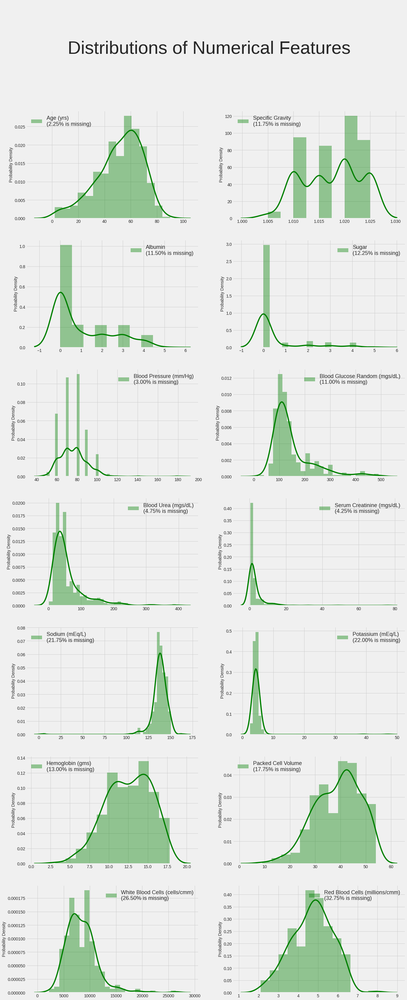

In [ ]:
n_rows, n_cols = (int(len(numeric)/2),2) #Since we have 14 numerical features in total
#Initializing the subplot
figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 50))
figure.suptitle('\n\nDistributions of Numerical Features', fontsize=60)

for index, column in enumerate(numeric):
    
    #The "coordinates" of each plot
    i,j = (index // n_cols), (index % n_cols)
    
    #Calculating the missing values percentage
    miss_perc="%.2f"%(100*(1-(data[column].dropna().shape[0])/data.shape[0]))
    
    collabel=column+"\n({}% is missing)".format(miss_perc)
    
    #Visualising the distribution of the numerical features
    fig=sns.distplot(data[column], color="g", label=collabel, norm_hist=True,
    
    ax=axes[i,j], kde_kws={"lw":4})
    
    fig=fig.legend(loc='best', fontsize=18)
    
    axes[i,j].set_ylabel("Probability Density",fontsize='medium')
    
    axes[i,j].set_xlabel(None)

plt.show()

##### Notes:
Some features show some very distant outliers.  
Some others have discrete values, but we will be treating them like continuous ones.  
The reason being is that these are measures of biological variables which are in reality continuous.   
Them being discrete is probably due to the method they've been measured with.  
Some features have high proportions of missing values, thus they cannot be imputed with measures of central tendency. That would distort their distributions.  
Plus, some features are very skewed while others are almost normal, some have a very distinct mode while some don't. Which means even if we didn't have so many missing values, we'd have to deal with each feature separately.  


Let's take a look at categorical features now.

In [ ]:
style.use('seaborn-darkgrid')

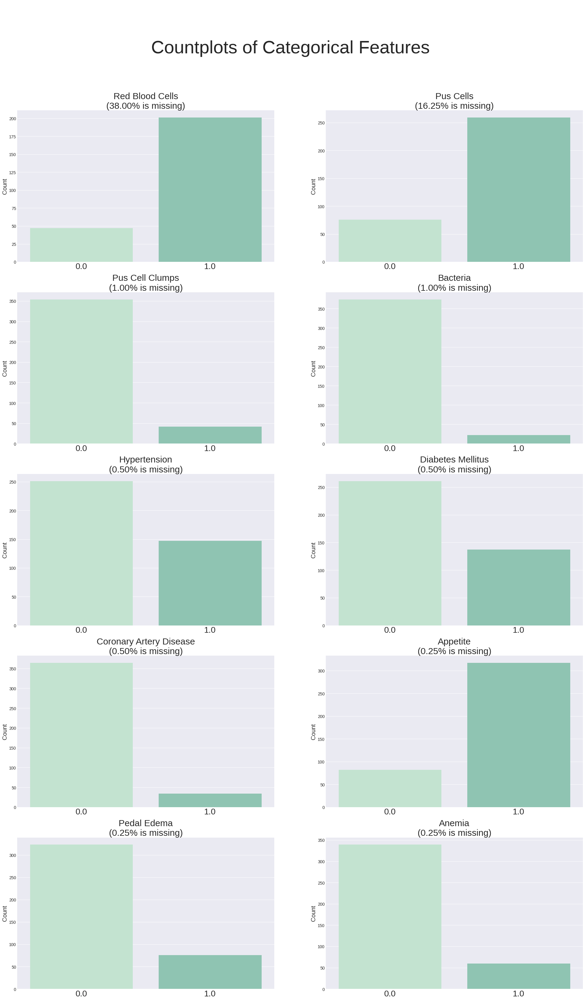

In [ ]:
n_rows, n_cols = (int(len(categoricals)/2),2) #Since we have 10 categorical features in total

#Initializing the subplot
figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(30, 50))
figure.suptitle('\n\nCountplots of Categorical Features', fontsize=60)

for index, column in enumerate(categoricals):
    
    #The "coordinates" of each plot
    i,j = index // n_cols, index % n_cols
    
    #Calculating the missing values percentage
    miss_perc="%.2f"%(100*(1-(data[column].dropna().shape[0])/data.shape[0]))
    
    collabel=column+"\n({}% is missing)".format(miss_perc)
    
    #Visualising the count of the categorical features
    fig = sns.countplot(x=column, data=data,label=collabel, palette=sns.cubehelix_palette(rot=-.35,light=0.85,hue=1),
    
    ax=axes[i,j])
    
    axes[i,j].set_title(collabel,fontsize=30)
    
    axes[i,j].set_xlabel(None)
    
    axes[i,j].set_ylabel("Count",fontsize=20)
    
    axes[i,j].set_xticklabels(axes[i,j].get_xticklabels(), Fontsize=28)

plt.show()

##### Notes:
Some features have very high percentages of missing values while some have almost none.  
Certain abnormalities/diseases seem relatively commun in this dataset, such as diabetes and hypertension.  
this sample of 400 people may not well-represent the population of India (which is where the data was collected), nor any other population.  


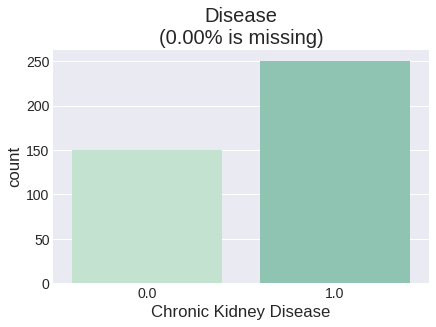

In [ ]:
#Calculating the missing values percentage of the target
miss_perc="%.2f"%(100*(1-(data['Chronic Kidney Disease'].dropna().shape[0])/data.shape[0]))
    
label="Disease\n(missing:\n{}%)".format(miss_perc)

#Visualising the count of the target
fig=sns.countplot(x=data['Chronic Kidney Disease'],label=label, palette=sns.cubehelix_palette(rot=-.35,light=0.85,hue=1))
plt.title("Disease\n({}% is missing)".format(miss_perc))
plt.show()

##### Notes:
We can see there are 0 missing values in the target, which is logical because this is not a semi-supervised problem.

This further shows that this dataset represents neither a country/community nor even a group of ill people (more than 60% of the population is ill).  

Let's take a look at missing values.

In [ ]:
style.use('seaborn-darkgrid')

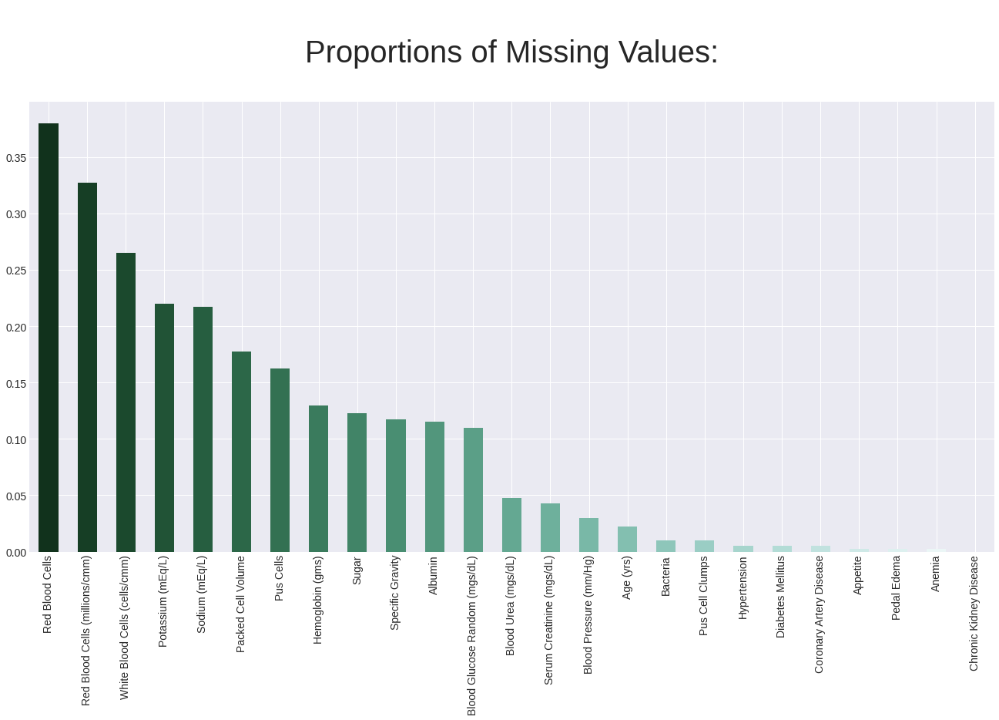

In [ ]:
d=((data.isnull().sum()/data.shape[0])).sort_values(ascending=False)
d.plot(kind='bar',
       color=sns.cubehelix_palette(start=2,
                                    rot=0.15,
                                    dark=0.15,
                                    light=0.95,
                                    reverse=True,
                                    n_colors=24),
        figsize=(20,10))
plt.title("\nProportions of Missing Values:\n",fontsize=40)
plt.show()

### Data Transformations

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler

The Quantile Transformer transforms a distribution into a normal or uniform one. We will be trying both.  
The Power Transformer applies another non-linear transformation to make your data more normal-like.  
StandardScaler standardizes your features.  
RobustScaler centers data but, instead of dividing by the standard deviation, it divides by an inter-quantile range that can be specified (to minimize the effect of the outliers).  
You can either specify the inter-quantile range or just leave it to default, which is [25,75].

In [ ]:
NQT=QuantileTransformer(output_distribution='normal')
UQT=QuantileTransformer(output_distribution='uniform')
SPT=PowerTransformer()
RS=RobustScaler() #default
WRS=RobustScaler(quantile_range=(15,85)) # a "wider" range
SS=StandardScaler()

Transformers=[NQT,UQT,SPT,RS,WRS,SS]
tr_names = ['Normal Quantile Transformer', 'Uniform Quantile Transformer', 'Power Transformer', 'Robust Scaler', 'Wide Robust Scaler', 'Standard Scaler']

In [ ]:
#Seperating the dataset into numerical and categorical datasets
categorical_feats = pd.DataFrame()
numeric_feats = pd.DataFrame()
for col in categoricals:
  categorical_feats=pd.concat([categorical_feats, data[col]], axis = 1)
for col in numeric:
  numeric_feats=pd.concat([numeric_feats, data[col]], axis = 1)

#Ordering the variables by their type (numerical/categorical)
data = pd.concat([numeric_feats, categorical_feats, data['Chronic Kidney Disease']], axis = 1)  

In [ ]:
#Applying each transformer to the numerical features and storing all the outcomes in a list of arrays
datarrays=[]
for tr in Transformers:
    arr=tr.fit_transform(numeric_feats)
    datarrays.append(arr)

In [ ]:
#Creating a DataFrame for each outcome and storing them in a list
dataframes=[numeric_feats]
for arr in datarrays:
    df=pd.DataFrame(arr,columns=numeric_feats.columns)
    df = pd.concat([df, categorical_feats, data['Chronic Kidney Disease']], axis = 1)
    dataframes.append(df)

Let's take a look at what these transformations did to our data.  
P.S: the second (blue) robustscaler is the wider one, and the first (orange) powertransformer is the normalized one.

In [ ]:
style.use('fivethirtyeight')

In [ ]:
colors=['crimson','steelblue','darkorange','darkviolet','gold','mediumblue','lime']

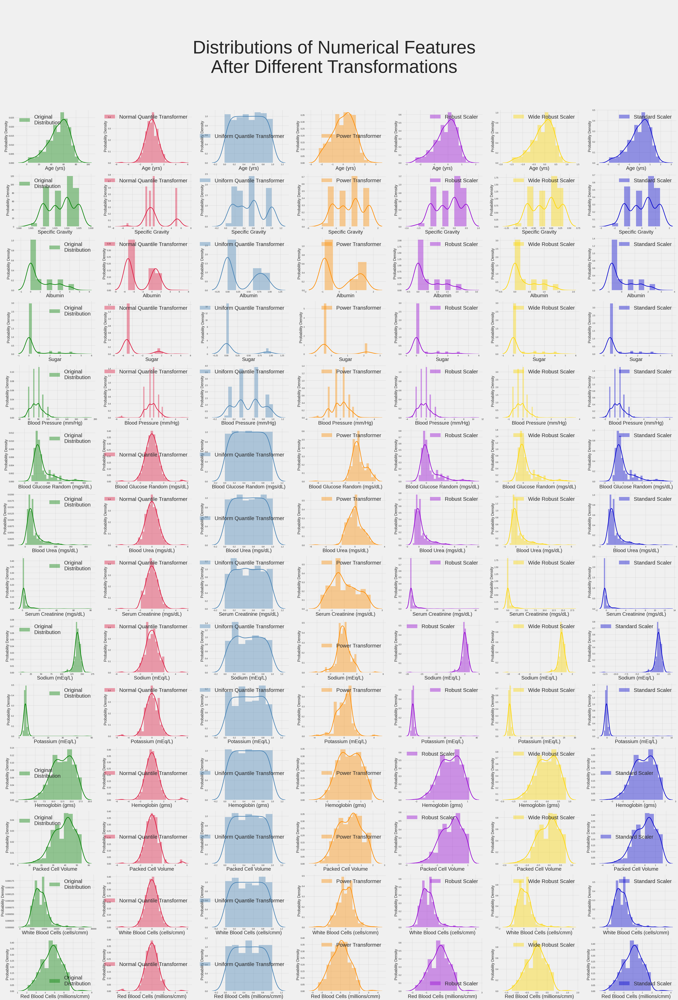

In [ ]:
n_rows, n_cols = (len(numeric),7) #Since we have 14 numerical features and 6 transformers(+the untransformed dataset)

#Initializing the subplots
figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of Numerical Features\nAfter Different Transformations', fontsize=120)

for i, col in enumerate(numeric):
    #Visualizing the distribution of each numercial feature
    fig = sns.distplot(data[col], color="g", label='Original\nDistribution', norm_hist=True,
    
    ax=axes[i,0], kde_kws={"lw":4})
    
    fig=fig.legend(loc='best', fontsize=35)
    
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    
    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j in range(1,7):
    for i, col in enumerate(numeric):
        #Assigning a label to each graph
        label=tr_names[j-1]
        
        #Visualizing the distribution of each numerical feature after each transformation
        fig = sns.distplot(dataframes[j][col], color=colors[j-1], label=label, norm_hist=True,

        ax=axes[i,j], kde_kws={"lw":4})
        
        fig=fig.legend(loc='best', fontsize=35)
    
        axes[i,j].set_ylabel("Probability Density",fontsize=25)
        
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=33)

plt.show()

##### Notes:
Both quantile transformers did a very decent job (despite the piles of outliers mentionned earlier)  
The unstandardized, normalized powertransformer (orange) performed quite awfully.  
The Standardized power transformer (purple) is, in contrast, quite decent.  
Linear transformers have almost identical results.  Good ones nonetheless.
Non-linear transformations (from red to purple) don't seem to have dealt with ordinal features well.  
But we only get to judge after seeing the imputation results.  
The gaussian quantile transformer (red) piled up outliers on the edges.
Linear transformers (last three) didn't change shapes of distributions.  
Everything will be evaluated after imputation. 

### Imputation

In [ ]:
from sklearn.impute import KNNImputer

In [ ]:
knnimp=KNNImputer(weights='distance', n_neighbors=8)

In [ ]:
#Imputing the original dataset
data_imp = knnimp.fit_transform(data)

In [ ]:
#Imputing the transformed datasets
rrr=[data.to_numpy()]
for dfi in range(1,len(dataframes)):
    rrr.append(knnimp.fit_transform(dataframes[dfi]))

In [ ]:
impdf=[]
for i in range(len(rrr)):
    impdf.append(pd.DataFrame(rrr[i],columns=data.columns))

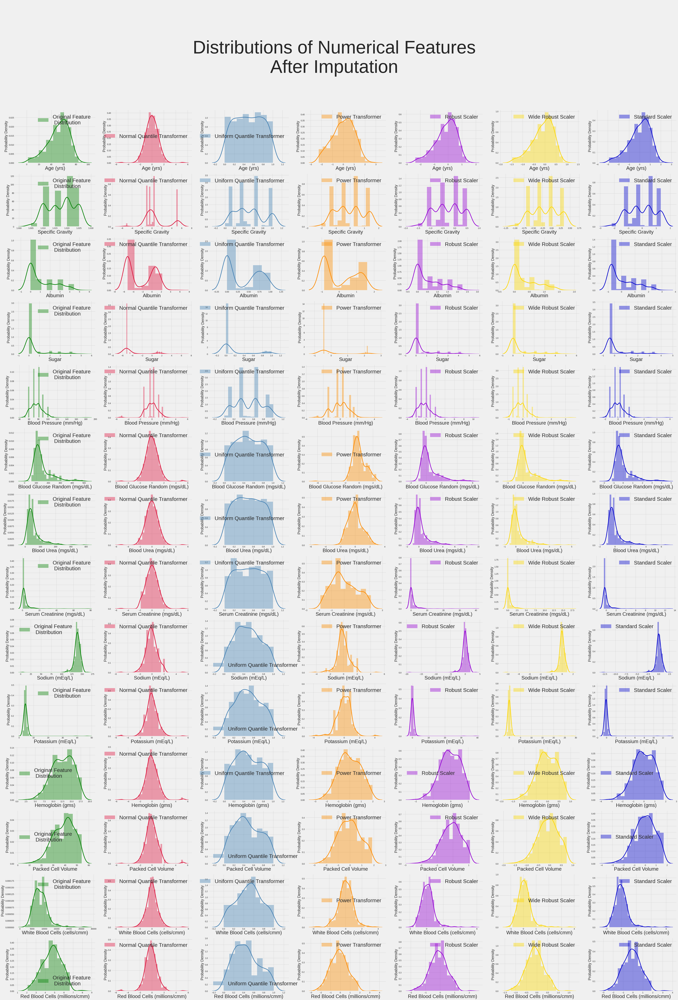

In [ ]:
n_rows, n_cols = (len(numeric),7)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of Numerical Features\nAfter Imputation', fontsize=120)
for i,col in enumerate(numeric):
    fig = sns.distplot(data[col], color="g", label='Original Feature\n Distribution', norm_hist=True,
    
    ax=axes[i,0], kde_kws={"lw":4})
    
    fig=fig.legend(loc='best', fontsize=35)
    
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    
    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j in range(1,7):
    for i, col in enumerate(numeric):
        label=tr_names[j-1]
        
        fig = sns.distplot(impdf[j][col], color=colors[j-1], label=label, norm_hist=True,

        ax=axes[i,j], kde_kws={"lw":4})
        
        fig=fig.legend(loc='best', fontsize=35)
    
        axes[i,j].set_ylabel("Probability Density",fontsize=25)
        
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=33)

plt.show()

Finally, we can conclude that the transformer that best kept the distribution of the data is the wide robust scaler, which is pretty logical since we have a few bust serious outliers

# Exploratory Data Analysis

In [ ]:
style.use('seaborn-darkgrid')

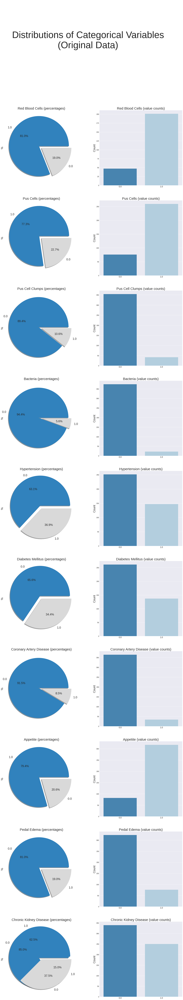

In [ ]:
n_rows, n_cols = (10,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(25, 130))
figure.suptitle('\n\n\nDistributions of Categorical Variables\n(Original Data)', fontsize=80)

for i in range(len(categoricals)):
    column=categoricals[i]
    graph1=data[column].value_counts().plot.pie(autopct='%1.1f%%',
                                                      ax=axes[i,0],
                                                      colormap="tab20c",
                                                      fontsize=25,
                                                      shadow=True,
                                                      explode=[0.1,0])
    axes[i,0].set_ylabel('%',fontsize=25)
    axes[i,0].set_title(column+' (percentages)', fontsize=30)
    graph2=sns.countplot(x=column,
                         data=data,
                         palette='Blues_r',
                         ax=axes[i,1])
    axes[i,1].set_xlabel(None)
    axes[i,1].set_ylabel('Count',fontsize=25)
    axes[i,1].set_xticklabels(axes[i,1].get_xticklabels(), Fontsize=18)
    axes[i,1].set_title(column+' (value counts)', fontsize=30)
    

graph1=data['Chronic Kidney Disease'].value_counts().plot.pie(autopct='%1.1f%%',
                                                              ax=axes[9,0],
                                                              colormap='tab20c',
                                                              fontsize=25,
                                                              shadow=True,
                                                              explode=[0.1,0])
axes[9,0].set_ylabel("%",fontsize=25)
axes[9,0].set_title('Chronic Kidney Disease (percentages)',fontsize=30)


graph2=sns.countplot(x='Chronic Kidney Disease',
                     data=data,
                     palette='Blues_r',
                     ax=axes[9,1])
axes[9,1].set_xlabel(None,fontsize=25)
axes[9,1].set_ylabel("Count",fontsize=25)
axes[9,1].set_xticklabels(axes[9,1].get_xticklabels(), Fontsize=18)
axes[9,1].set_title('Chronic Kidney Disease (value counts)', fontsize=30)

plt.show()

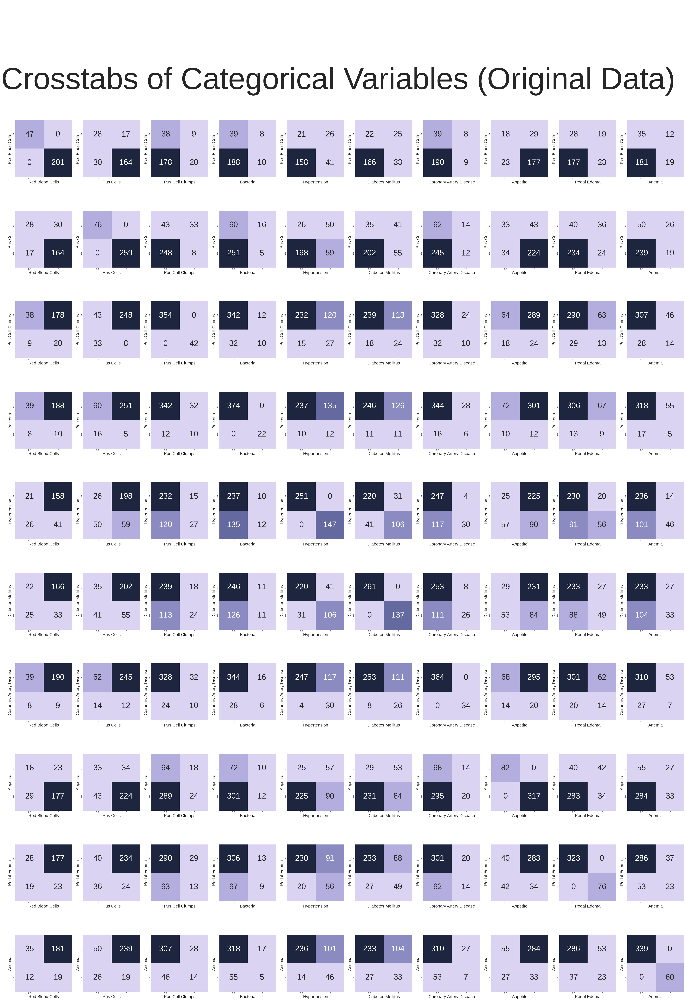

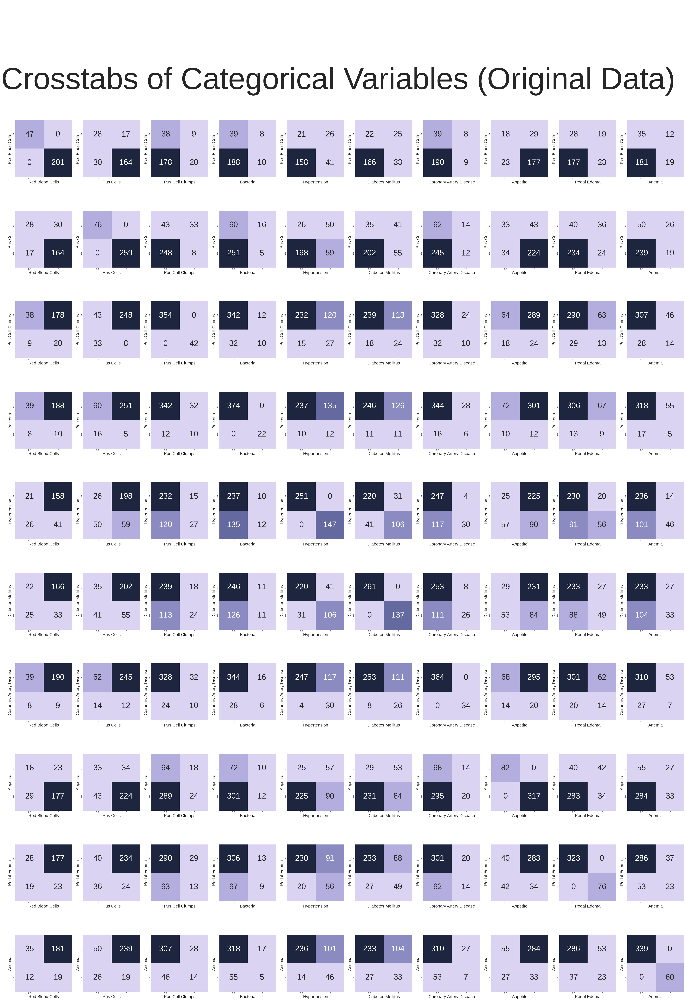

In [ ]:
n_rows, n_cols = (10,10)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nCrosstabs of Categorical Variables (Original Data)\n', fontsize=200)

for i in range(10):
    for j in range(10):
        sns.heatmap(
                    pd.crosstab(data[categoricals[i]],data[categoricals[j]]),
                    ax=axes[i,j],
                    cmap=sns.cubehelix_palette(start=2.8, rot=.1),
                    square='True',
                    cbar=False,
                    annot=True,
                    annot_kws={'fontsize':52},
                    fmt='d')
        
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=28)
        
        axes[i,j].set_ylabel(axes[i,j].get_ylabel(),fontsize=28)
        
plt.show()

In [ ]:
style.use('seaborn-darkgrid')

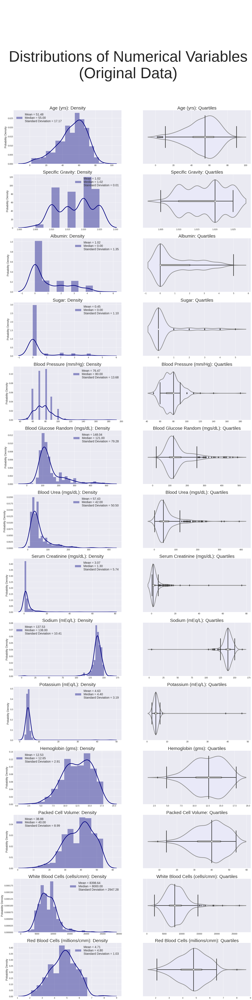

In [ ]:
n_rows, n_cols = (14,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(25, 100))
figure.suptitle('\n\n\nDistributions of Numerical Variables\n(Original Data)', fontsize=100)

for i in range(len(numeric)):
    col=numeric[i]
    
    label='Mean = {}\nMedian = {}\nStandard Deviation = {}'.format(str("%.2f"%data[col].mean()),
                                                                    str("%.2f"%data[col].median()),
                                                                    str("%.2f"%data[col].std()))
    
    graph1=sns.distplot(data[col],
                        color="navy",
                        ax=axes[i,0],
                        kde_kws={"lw":4},
                        norm_hist=True,
                        label=label).legend(loc='best',fontsize=20)
    axes[i,0].set_title(col+': Density',fontsize=30)
    axes[i,0].set_xlabel(None)
    axes[i,0].set_ylabel("Pobability Density",fontsize=18)

    graph20=sns.violinplot(x=col,
                          data=data,
                          ax=axes[i,1],
                          color='lavender',
                          inner='box')
    graph21=sns.boxplot(x=col,
                        data=data,
                        ax=axes[i,1],
                        fliersize=8,
                        boxprops=dict(alpha=0))
    
    axes[i,1].set_xlabel(None)
    axes[i,1].set_title(col+': Quartiles',fontsize=30)
    
    
plt.show()

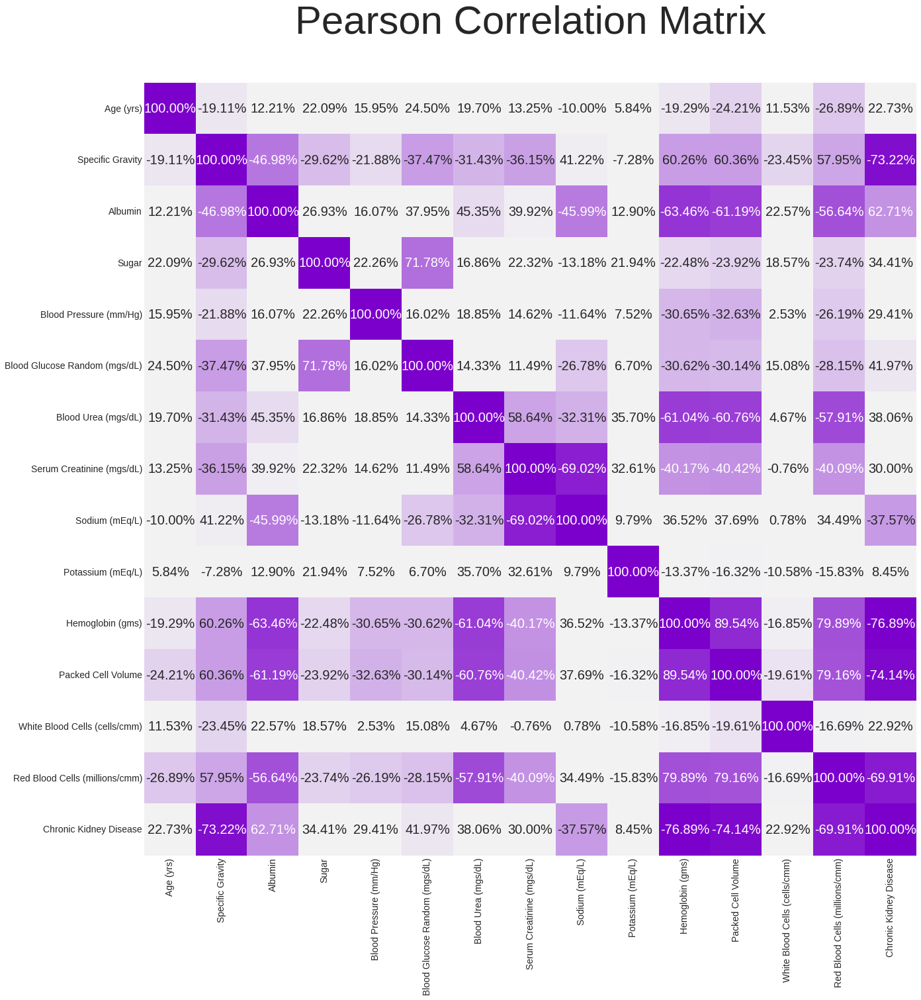

In [ ]:
numericdat=data.drop(categoricals, axis=1, inplace=False)

plt.figure(figsize=(20,20))

sns.heatmap(numericdat.corr("pearson"),
            cmap=sns.diverging_palette(280, 280, s=100, l=35, as_cmap=True,sep=80),
            square=True,
            annot=True,
            annot_kws={'fontsize':20},
            fmt='.2%',
            cbar=False)
plt.title("Pearson Correlation Matrix\n",fontsize=60)
plt.show()

##### Notes:
We can notice high correlations(>70% and >-70%) between certain columns.  

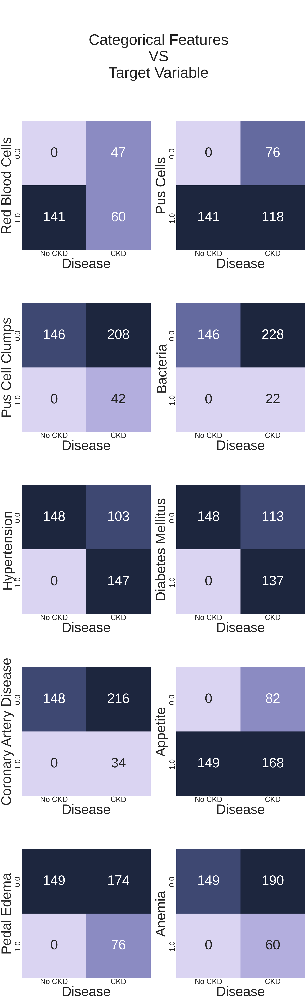

In [ ]:
n_rows, n_cols = (5,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(30, 100))
figure.suptitle('\n\nCategorical Features\nVS\nTarget Variable', fontsize=100)

for index, column in enumerate(categoricals):
    
    i,j = (index // n_cols), (index % n_cols)
    
    sns.heatmap(pd.crosstab(data[column],data['Chronic Kidney Disease']),
                ax=axes[i,j],
                cmap=sns.cubehelix_palette(start=2.8, rot=.1),
                square='True',
                cbar=False,
                annot=True,
                annot_kws={'fontsize':90},
                fmt='d')
        
    axes[i,j].set_xlabel("Disease", fontsize=90)

    axes[i,j].set_ylabel(column,fontsize=90)
    
    axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(),fontsize=50)
    
    axes[i,j].set_xticklabels(["No CKD","CKD"],fontsize=50)

plt.show()

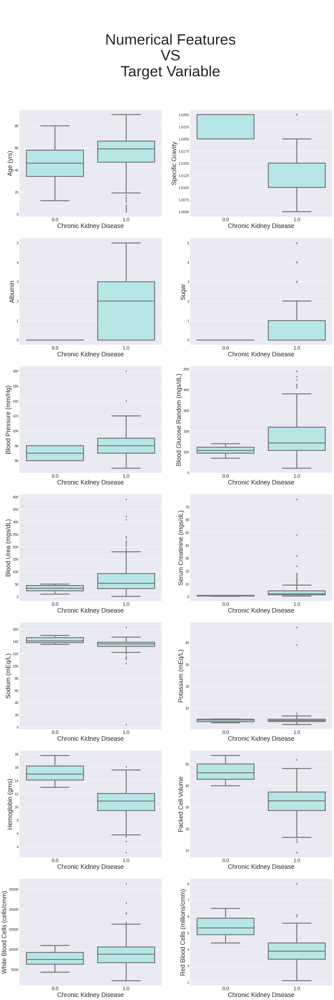

In [ ]:
n_rows, n_cols = (7,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 60))
figure.suptitle('\n\nNumerical Features\nVS\nTarget Variable', fontsize=60)

for index, column in enumerate(numeric):
    
    i,j = (index // n_cols), (index % n_cols)
    
    bp=sns.boxplot(y=column, x='Chronic Kidney Disease', data=data, color="paleturquoise",
    
    ax=axes[i,j])
        
    axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=25)

    axes[i,j].set_ylabel(column,fontsize=25)
    
    axes[i,j].set_xticklabels(axes[i,j].get_xticklabels(),fontsize=20)

plt.show()

In [ ]:
colors3=['deepskyblue','turquoise','mediumspringgreen','turquoise']

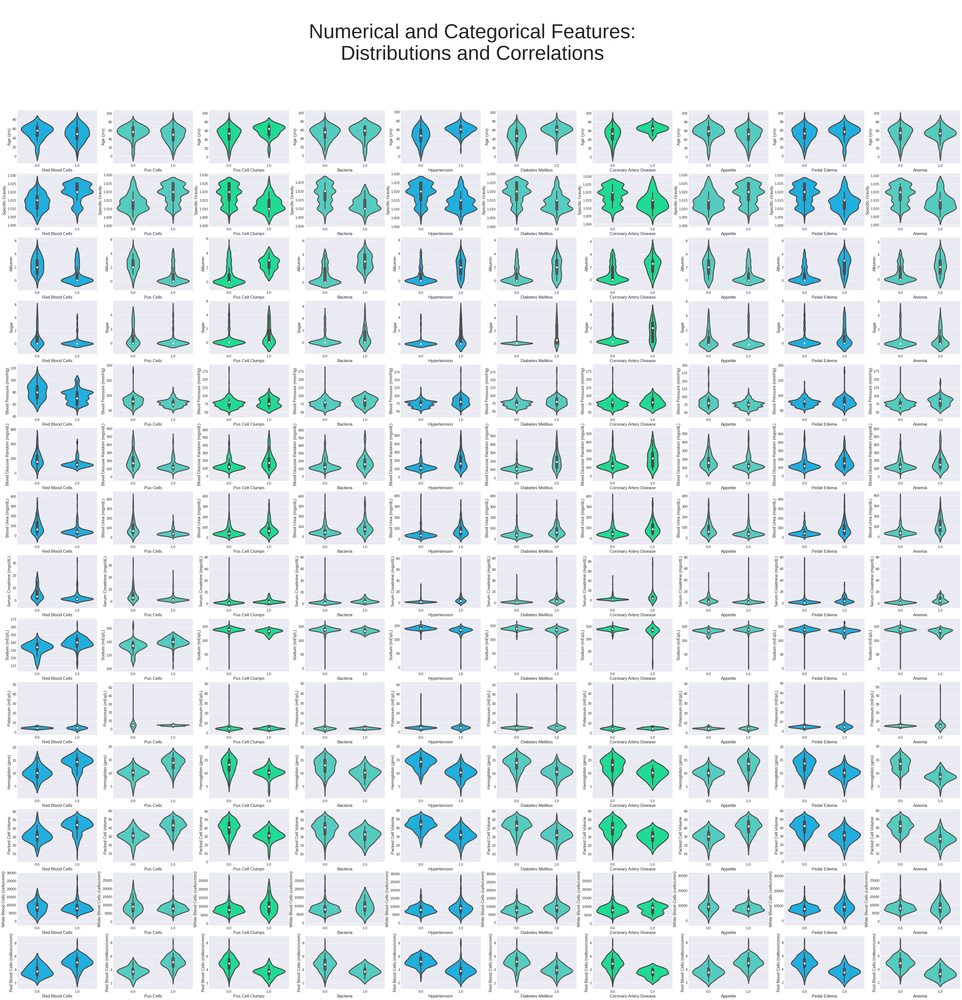

In [ ]:
n_rows, n_cols = (14,10)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(60, 60))
figure.suptitle('\nNumerical and Categorical Features:\nDistributions and Correlations', fontsize=80)

for i in range(14):
    for j in range(10):
        graph=sns.violinplot(y=numeric[i],x=categoricals[j],data=data,color=colors3[j%4],ax=axes[i,j])
plt.show()

 Prediction

In [ ]:
X=data_imp[:,:24]
Y=data_imp[:,24]

In [ ]:
full_scaled_data=SS.fit_transform(data)
scaled_data=WRS.fit_transform(X)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(scaled_data, Y, test_size=0.2, random_state=12)

### Linear-Kernel SVC

The distributions shown in the next graph represent LDA results only on training data

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA

In [ ]:
lin_svc=SVC(kernel='linear')

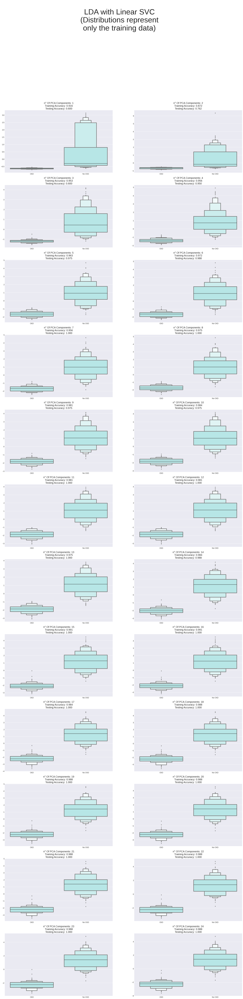

In [ ]:
n_rows, n_cols= 12,2

figure, axes = plt.subplots(nrows=n_rows,ncols= n_cols, figsize=(30, 120))

figure.suptitle('\nLDA with Linear SVC\n(Distributions represent\nonly the training data)', fontsize=60)

for index in range(24):
    
    i,j = (index // n_cols), (index % n_cols)
    
    pca=PCA(n_components=index+1)
    
    lda=LinearDiscriminantAnalysis()
    
    some_pipe=make_pipeline(pca,lda)
    
    X_lda_train=some_pipe.fit_transform(X_train,Y_train)
    
    X_lda_test=some_pipe.fit_transform(X_test,Y_test)
    
    lin_svc.fit(X_lda_train,Y_train)
    
    y_pred_train=lin_svc.predict(X_lda_train)
    
    train_acc= accuracy_score(y_pred_train,Y_train)
    
    y_pred_test=lin_svc.predict(X_lda_test)
    
    test_acc= accuracy_score(y_pred_test,Y_test)
    
    X_lda_train=X_lda_train.reshape((320,))
    
    bp=sns.boxenplot(y=X_lda_train, x=Y_train, color="paleturquoise",showfliers=True,ax=axes[i,j])
    
    axes[i,j].set_title("n° Of PCA Components: {}\nTraining Accuracy: {}\nTesting Accuracy: {}".format(index+1,
                                                                                                       "%.3f"%train_acc,
                                                                                                       "%.3f"%test_acc))
    axes[i,j].set_xlabel(None)
    
    axes[i,j].set_xticklabels(["CKD","No CKD"])
    
plt.show()

Low variance despite the fact that the testing set is 0.2 of the whole dataset, which only has 400 samples.  

### Evaluating A Few Other Models

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [ ]:
SVM_RBF=SVC()
    
SVM_Poly2=SVC(kernel='poly',degree=2)
    
SVM_Poly3=SVC(kernel='poly',degree=3)

KNN3=KNeighborsClassifier(n_neighbors=3,weights='distance')

KNN8=KNeighborsClassifier(n_neighbors=8,weights='distance')

KNN15=KNeighborsClassifier(n_neighbors=15,weights='distance')

Naive_Bayes=GaussianNB()

LogReg=LogisticRegression()

Tree=DecisionTreeClassifier()

Forest=RandomForestClassifier()

models=[SVM_RBF,SVM_Poly2,SVM_Poly3,KNN3,KNN8,KNN15,Naive_Bayes,LogReg,Tree,Forest]

names=["SVM_RBF","SVM_Poly2","SVM_Poly3","Weighted 3NearestNeighbors","Weighted 8NearestNeighbors",
       "Weighted 15NearestNeighbors","Naive Bayes","Logistic Regression","Decision Tree","Random Forest"]

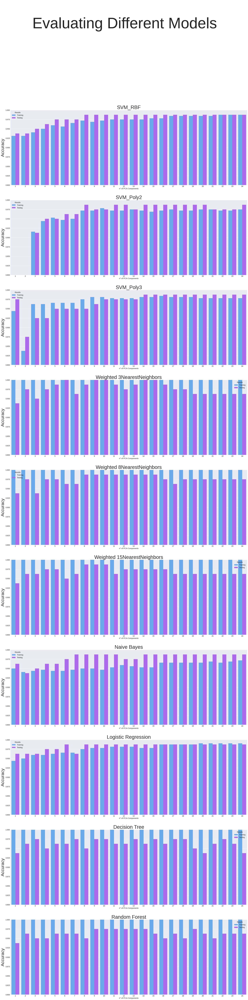

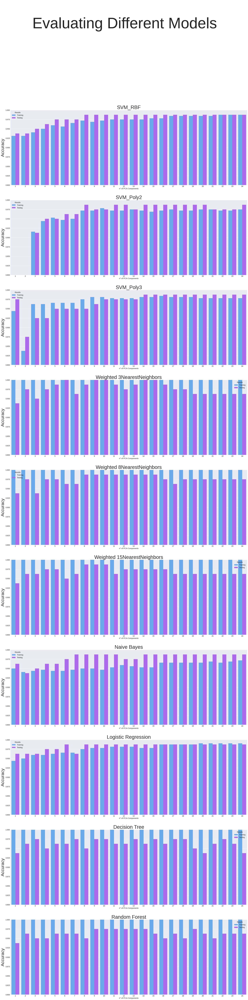

In [ ]:
n_rows, n_cols= 10,1

figure, axes = plt.subplots(nrows=n_rows,ncols= n_cols, figsize=(30, 120))

figure.suptitle('\nEvaluating Different Models', fontsize=120)



tr_mask = np.empty(shape=(24,1),dtype="object")
    
ts_mask = np.empty(shape=(24,1),dtype="object")

for i in range(24):
    tr_mask[i]="Training"
    ts_mask[i]="Testing"

mask = np.vstack((tr_mask,ts_mask))

mask=mask.reshape((48,))

cmps=[i for i in range(1,25)] * 2


for index in range(10):
    
    pca_tr_acc=[]
    
    pca_ts_acc=[]
    
    
    for n_comps in range(1,25):
        
        model=models[index]
        
        pca=PCA(n_components=n_comps)
        
        pca_model=make_pipeline(pca,model)
        
        pca_model.fit(X_train,Y_train)
        
        y_tr_pred= pca_model.predict(X_train)
        
        pca_tr_acc.append(accuracy_score(y_tr_pred,Y_train))
        
        y_ts_pred=pca_model.predict(X_test)
        
        pca_ts_acc.append(accuracy_score(y_ts_pred,Y_test))
        
    
    model_data = pd.DataFrame()
    
    model_data["PCA"] = pca_tr_acc + pca_ts_acc
        
    model_data["Results"] = mask
    
    sns.barplot(x=cmps, y="PCA", hue="Results", data=model_data, palette='cool', ax=axes[index]).set(ylim=(0.8,1))
    
    axes[index].set_title(names[index],fontsize=40)
    
    axes[index].set_xlabel("n° of PCA Components",fontsize=15)
    
    axes[index].set_ylabel("Accuracy",fontsize=35)
    
    axes[index].set_xticklabels(axes[index].get_xticklabels(),fontsize=15)
    
    
plt.show()

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
boost_models = [SVC(),
 SVC(degree=2, kernel='poly'),
 SVC(kernel='poly'),
 GaussianNB(),
 LogisticRegression(),
 DecisionTreeClassifier(),
 RandomForestClassifier()]

In [ ]:
for mod in boost_models:
  booster = AdaBoostClassifier(base_estimator = mod, algorithm = 'SAMME')
  booster.fit(X_train, Y_train)
  print(mod, booster.score(X_test, Y_test))

SVC() 0.6
SVC(degree=2, kernel='poly') 0.6
SVC(kernel='poly') 0.6
GaussianNB() 0.9375
LogisticRegression() 0.975
DecisionTreeClassifier() 0.975
RandomForestClassifier() 0.9625
SVC(degree=2, kernel='poly') 0.6
SVC(kernel='poly') 0.6
GaussianNB() 0.9375
LogisticRegression() 0.975
DecisionTreeClassifier() 0.975
RandomForestClassifier() 0.9625


As we can see the models didn't really improve comparing to the ones without boosting

### Neural Networks

So We will be trying a small neural network with one hidden layer containing 4 neurons, and a bigger one with 3 hidden layers and lots of neurons.

In [ ]:
import tensorflow
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical

In [ ]:
early_stopping_monitor = EarlyStopping(patience=5, monitor='accuracy')
Y_net = to_categorical(Y)

In [ ]:
pca_tr_acc_1=[]
    
pca_ts_acc_1=[]


pca_tr_acc_2=[]
    
pca_ts_acc_2=[]


for i in range(1,25):
    
    pca=PCA(n_components=i)
    
    X_pca=pca.fit_transform(scaled_data)
    
    X_pca_train, X_pca_test, Y_train, Y_test = train_test_split(X_pca, Y_net, test_size=0.25, random_state=12)
    
    #little net
    net1= Sequential()
    
    net1.add(Dense(4, activation='relu', input_shape = (i,)))
    
    net1.add(Dense(2, activation='softmax'))
    
    net1.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
    
    net1.fit(X_pca_train, Y_train, epochs=50, callbacks=[early_stopping_monitor], verbose=0)
    
    y_tr_pred=net1.predict(X_pca_train)
    
    pca_tr_acc_1.append(accuracy_score(np.argmax(y_tr_pred, axis=1),Y_train[:,1]))
    
    y_ts_pred=net1.predict(X_pca_test)
    
    pca_ts_acc_1.append(accuracy_score(np.argmax(y_ts_pred, axis=1),Y_test[:,1]))
    
    
    
    #big net
    net2= Sequential()
    
    net2.add(Dense(50, activation='relu', input_shape = (i,)))
    
    net2.add(Dense(30, activation='relu'))
    
    net2.add(Dense(20, activation='relu'))
    
    net2.add(Dense(10, activation='relu'))
    
    net2.add(Dense(2, activation='softmax'))
    
    net2.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
    
    net2.fit(X_pca_train, Y_train, epochs=100, callbacks=[early_stopping_monitor], verbose=0)
    
    y_tr_pred=net2.predict(X_pca_train)
    
    pca_tr_acc_2.append(accuracy_score(np.argmax(y_tr_pred, axis=1),Y_train[:,1]))
    
    y_ts_pred=net2.predict(X_pca_test)
    
    pca_ts_acc_2.append(accuracy_score(np.argmax(y_ts_pred, axis=1),Y_test[:,1]))

4/4 [==============================] - 0s 3ms/step


In [ ]:
tr_mask = np.empty(shape=(24,1),dtype="object")
    
ts_mask = np.empty(shape=(24,1),dtype="object")

for i in range(24):
    tr_mask[i]="Training"
    ts_mask[i]="Testing"

mask = np.vstack((tr_mask,ts_mask))

mask=mask.reshape((48,))

cmps=[i for i in range(1,25)] * 2


net1_data = pd.DataFrame()
    
net1_data["PCA"] = pca_tr_acc_1 + pca_ts_acc_1

net1_data["Results"] = mask


net2_data = pd.DataFrame()
    
net2_data["PCA"] = pca_tr_acc_2 + pca_ts_acc_2

net2_data["Results"] = mask

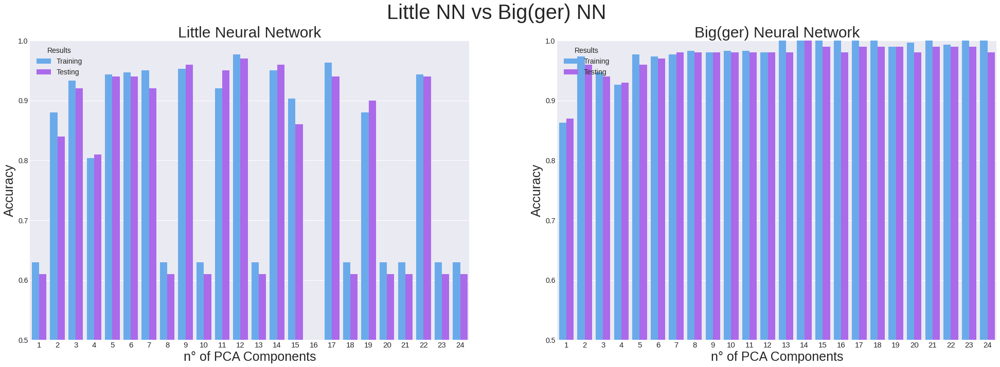

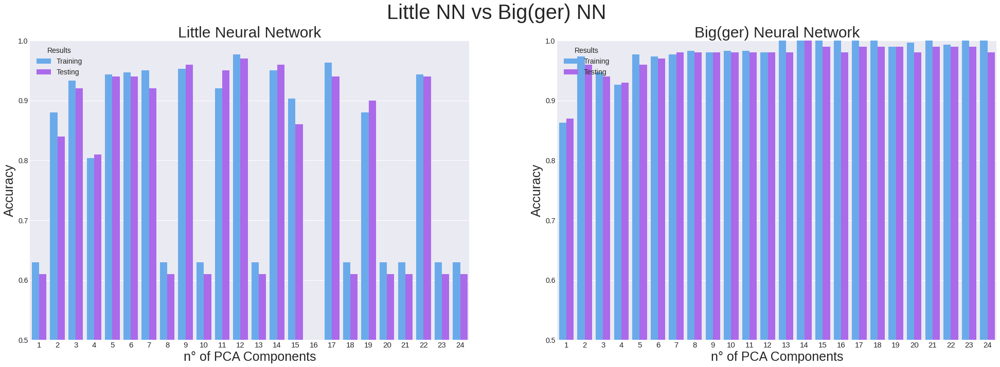

In [ ]:
n_rows, n_cols= 1,2

figure, axes = plt.subplots(nrows=n_rows,ncols= n_cols, figsize=(30, 10))

figure.suptitle('Little NN vs Big(ger) NN', fontsize=40)



graph1=sns.barplot(x=cmps, y="PCA", hue="Results", data=net1_data, palette='cool', ax=axes[0]).set(ylim=(0.5,1))

axes[0].set_title("Little Neural Network",fontsize=30)

axes[0].set_xlabel("n° of PCA Components",fontsize=25)

axes[0].set_ylabel("Accuracy",fontsize=25)

axes[0].set_xticklabels(axes[0].get_xticklabels(),fontsize=15)



graph2=sns.barplot(x=cmps, y="PCA", hue="Results", data=net2_data, palette='cool', ax=axes[1]).set(ylim=(0.5,1))

axes[1].set_title("Big(ger) Neural Network",fontsize=30)

axes[1].set_xlabel("n° of PCA Components",fontsize=25)

axes[1].set_ylabel("Accuracy",fontsize=25)

axes[1].set_xticklabels(axes[1].get_xticklabels(),fontsize=15)

plt.show()